Modul yang digunakan

In [1]:
from skimage import measure
import numpy as np
import cv2
import hashlib
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import os
from datetime import datetime

Peta Logistik Miring

In [3]:
# Peta logistik miring dengan alpha = 4
def chaos_next(x, q):
    return np.where(
        x <= q,
        1.0 - (x / q - 1.0) ** 2,
        1.0 - ((q - x) / (q - 1.0)) ** 2
    )

# Membuat stream chaos
def generate_chaos_sequence(x0, q, length):
    seq = np.empty(length, dtype=float)
    x = float(x0)
    for i in range(length):
        x = float(np.clip(chaos_next(x, q), 1e-15, 1-1e-15))
        seq[i] = x
    return seq

Fungsi Hash SHA-256

In [4]:
def seeds_from_image_sha256(img_gray):
    h = hashlib.sha256(img_gray.tobytes()).hexdigest()
    parts = [int(h[0:13],16), int(h[13:26],16), int(h[26:39],16),
             int(h[39:52],16), int(h[52:64],16)]
    seed_x = (parts[0] + parts[1] + parts[-1]) / 1e16
    seed_y = (parts[2] + parts[3] + parts[-1]) / 1e16
    seed_x = float((seed_x % 1.0) or 0.5)
    seed_y = float((seed_y % 1.0) or 0.5)
    return seed_x, seed_y

Transient dan membuat initial baru

In [5]:
def transient_reinit(seed_x, seed_y, q1, q2):
    x_seq = generate_chaos_sequence(seed_x, q1, 51)
    y_seq = generate_chaos_sequence(seed_y, q2, 51)
    x_eff = (x_seq[49] + y_seq[48]) % 1.0
    y_eff = (x_seq[48] + y_seq[49]) % 1.0
    x_eff = float(np.clip(x_eff, 1e-15, 1-1e-15))
    y_eff = float(np.clip(y_eff, 1e-15, 1-1e-15))
    return x_eff, y_eff

Menampilkan 8 Level Bit

In [ ]:
# Fungsi untuk menampilkan 8 level bit
def display_8_bit_planes(img, title="8 Level Bit", save_path=None):
    M, N = img.shape
    bit_planes = np.zeros((M, N, 8), dtype=np.uint8)

    # Ekstrak setiap bit plane
    for i in range(8):
        bit_plane = (img >> i) & 1
        bit_planes[:, :, i] = bit_plane * 255  # Konversi ke 0-255 untuk display

    # Buat figure untuk menampilkan semua bit planes
    fig, axes = plt.subplots(2, 4, figsize=(15, 8))
    # fig.suptitle(title, fontsize=16, fontweight='bold')

    for i in range(8):
        ax = axes[i//4, i%4]
        ax.imshow(bit_planes[:, :, i], cmap='gray')
        ax.set_title(f'Bit {i+1} (2^{i})', fontweight='bold')
        ax.axis('off')

    plt.tight_layout()

    # Simpan gambar jika path diberikan
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')

    return fig, bit_planes

Visualisasi bit plane reshaping

In [ ]:
# Fungsi untuk visualisasi bit plane reshaping
"""
Visualisasi perbandingan sebelum dan sesudah bit plane reshaping
"""

def visualize_bit_plane_reshaping(original_bits, shuffled_bits, shuffle_order, title, save_path=None):
    fig, axes = plt.subplots(2, 8, figsize=(20, 6))
    # fig.suptitle(title, fontsize=16, fontweight='bold')

    # Tampilkan bit planes asli
    for i in range(8):
        ax = axes[0, i]
        ax.imshow(original_bits[:, :, i], cmap='gray')
        # ax.set_title(f'Bit {i+1} Asli', fontsize=10)
        ax.axis('off')

    # Tampilkan bit planes setelah shuffle
    for i in range(8):
        ax = axes[1, i]
        original_idx = shuffle_order[i]
        ax.imshow(shuffled_bits[:, :, i], cmap='gray')
        # ax.set_title(f'Bit {i+1} ← Bit {original_idx+1}', fontsize=10, color='red')
        ax.axis('off')

    # Tambahkan label baris
    axes[0, 0].set_ylabel('Sebelum Reshaping', rotation=90, size=12, fontweight='bold')
    axes[1, 0].set_ylabel('Sesudah Reshaping', rotation=90, size=12, fontweight='bold')

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    return fig

Enkripsi Citra

In [32]:
# Fungsi ENKRIPSI
def encrypt_image(img_gray, q1, q2, seed_x, seed_y, output_dir="output_images"):
    assert img_gray.ndim == 2 and img_gray.dtype == np.uint8
    M, N = img_gray.shape

    # Buat direktori output
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
        print(f"Direktori '{output_dir}' dibuat")

    print("="*70)
    print("PROSES ENKRIPSI CITRA")
    print("="*70)
    print(f"Ukuran gambar: {img_gray.shape}")
    print(f"Parameter chaos: q1={q1}, q2={q2}")

    # Dictionary untuk menyimpan setiap tahapan
    steps = {}

    # 1. Gambar Asli
    steps["original"] = img_gray.copy()
    plt.figure(figsize=(8, 6))
    plt.imshow(img_gray, cmap='gray')
    plt.title("Citra Asli (Grayscale)")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

    # Simpan gambar asli
    cv2.imwrite(os.path.join(output_dir, "1_original_image.png"), img_gray)

    # Menampilkan 8 level bit gambar asli
    print('Bentuk 8 bit dari Citra:')
    fig_bit_original, bit_planes_original = display_8_bit_planes(
        img_gray,
        "8 Level Bit - Gambar Asli",
        os.path.join(output_dir, "2_original_8bit_planes.png")
    )
    steps["bit_planes_original"] = bit_planes_original
    plt.show()

    # 3. Transient & re-init
    x0, y0 = transient_reinit(seed_x, seed_y, q1, q2)

    # 4. Bit-plane reshaping + shuffle pertama
    chaos_x = generate_chaos_sequence(x0, q1, 8)
    ind = np.argsort(chaos_x)[::-1]

    A_bits = np.unpackbits(img_gray, axis=1)
    A_planes_reshaped = A_bits.reshape(M, N, 8)
    A_planes_shuffled1 = A_planes_reshaped[:, :, ind]

    # Simpan hasil setelah shuffle pertama
    img_after_shuffle1 = np.packbits(A_planes_shuffled1, axis=2).reshape(M, N)
    steps["after_shuffle1"] = img_after_shuffle1.copy()
    cv2.imwrite(os.path.join(output_dir, "3_after_shuffle1.png"), img_after_shuffle1)

    # Menampilkan 8 level bit setelah shuffle pertama
    print('Bentuk 8-bit dari citra setelah dilakukan shuffle:')
    fig_bit_shuffle1, bit_planes_shuffle1 = display_8_bit_planes(
        img_after_shuffle1,
        "8 Level Bit - Setelah Shuffle Pertama",
        os.path.join(output_dir, "4_shuffle1_8bit_planes.png")
    )
    steps["bit_planes_shuffle1"] = bit_planes_shuffle1
    plt.show()

    # 5. Pergeseran baris pada masing-masing bit plane
    A_planes_flat = A_planes_shuffled1.reshape(M, 8*N)

    chaos_r = generate_chaos_sequence(chaos_x[-1], q1, M+1)
    r = np.floor(8*N * chaos_r[:M]).astype(int)
    r = np.roll(r, int(np.floor(M * chaos_r[-1])))

    # Proses pergeseran pada setiap baris
    for i in range(M):
        A_planes_flat[i] = np.roll(A_planes_flat[i], r[i])

    # Simpan hasil setelah pergeseran baris
    img_after_row_shift_bits = A_planes_flat.reshape(M, N, 8)
    img_after_row_shift = np.packbits(img_after_row_shift_bits, axis=2).reshape(M, N)
    steps["after_row_shift"] = img_after_row_shift.copy()

    # Simpan gambar setelah pergeseran baris
    cv2.imwrite(os.path.join(output_dir, "5_after_row_shift.png"), img_after_row_shift)

    # Menampilkan 8 level bit setelah pergeseran baris
    print('Citra plane 8-bit setelah di geser baris:')
    fig_bit_row_shift, bit_planes_row_shift = display_8_bit_planes(
        img_after_row_shift,
        "8 Level Bit - Setelah Row Shifting",
        os.path.join(output_dir, "6_row_shift_8bit_planes.png")
    )
    steps["bit_planes_row_shift"] = bit_planes_row_shift
    plt.show()

    # 6. Pergeseran Kolom pada masing-masing bit plane
    chaos_c = generate_chaos_sequence(chaos_r[-1], q1, 8*N+1)
    c = np.floor(M * chaos_c[:8*N]).astype(int)
    c = np.roll(c, int(np.floor(8*N * chaos_c[-1])))

    # Proses pergeseran kolom pada setiap kolom
    for j in range(8*N):
        A_planes_flat[:, j] = np.roll(A_planes_flat[:, j], c[j])

    # Simpan hasil setelah pergeseran kolom
    img_after_col_shift_bits = A_planes_flat.reshape(M, N, 8)
    img_after_col_shift = np.packbits(img_after_col_shift_bits, axis=2).reshape(M, N)
    steps["after_col_shift"] = img_after_col_shift.copy()

    # Simpan gambar setelah pergeseran kolom
    cv2.imwrite(os.path.join(output_dir, "7_after_column_shift.png"), img_after_col_shift)

    # Menampilkan 8 level bit setelah pergeseran kolom
    print('Citra plane 8-bit setelah digeser kolom:')
    fig_bit_col_shift, bit_planes_col_shift = display_8_bit_planes(
        img_after_col_shift,
        "8 Level Bit - Setelah Column Shifting",
        os.path.join(output_dir, "8_column_shift_8bit_planes.png")
    )
    steps["bit_planes_col_shift"] = bit_planes_col_shift
    plt.show()

    # 7. Penyatuan kembali 8 level bit dengan shuffle kedua
    chaos_y1 = generate_chaos_sequence(y0, q2, 8)
    pln = np.argsort(chaos_y1)[::-1]
    img_shuffled = np.packbits(img_after_col_shift_bits[:, :, pln], axis=2).reshape(M, N)
    steps["after_shuffle2"] = img_shuffled.copy()
    print('Sudah disatukan kembali:')
    plt.imshow(steps["after_shuffle2"], cmap='gray')
    plt.axis('off')
    plt.show()
    # Simpan gambar setelah penyatuan bit
    cv2.imwrite(os.path.join(output_dir, "9_after_bit_reconstruction.png"), img_shuffled)
    
    # 8. Membuat matriks Substitusi
    chaos_y2 = generate_chaos_sequence(chaos_y1[-1], q2, M*N+1)
    stream = np.mod(np.floor(1e10 * chaos_y2[:M*N]), 256).astype(np.uint8)
    stream = np.roll(stream, int(np.floor(M*N * chaos_y2[-1])))
    B = stream.reshape(M, N)
    steps["substitution_matrix"] = B.copy()
    print('Matriks Substitusi:')
    plt.imshow(steps["substitution_matrix"], cmap='gray')
    plt.axis('off')
    plt.show()
    # Simpan matriks substitusi
    cv2.imwrite(os.path.join(output_dir, "10_substitution_matrix.png"), B)

    # 9. Gambar hasil substitusi (XOR)
    cipher = cv2.bitwise_xor(img_shuffled, B)
    steps["cipher"] = cipher.copy()

    # Simpan gambar hasil substitusi
    cv2.imwrite(os.path.join(output_dir, "11_after_substitution.png"), cipher)

    return cipher, x0, y0, steps

Dekripsi Citra

In [19]:
# DEKRIPSI
def decrypt_image(cipher, q1, q2, seed_x, seed_y, output_dir="output_images"):
    M, N = cipher.shape
    x0, y0 = transient_reinit(seed_x, seed_y, q1, q2)

    # Regenerate substitution matrix
    chaos_y1 = generate_chaos_sequence(y0, q2, 8)
    chaos_y2 = generate_chaos_sequence(chaos_y1[-1], q2, M*N+1)
    stream = np.mod(np.floor(1e10 * chaos_y2[:M*N]), 256).astype(np.uint8)
    stream = np.roll(stream, int(np.floor(M*N * chaos_y2[-1])))
    B = stream.reshape(M, N)

    # Undo XOR
    A_shuffled = cv2.bitwise_xor(cipher, B)

    # Undo second bit-plane shuffle
    pln = np.argsort(chaos_y1)[::-1]
    inv_pln = np.argsort(pln)
    A_planes = np.unpackbits(A_shuffled, axis=1).reshape(M, N, 8)
    A_planes = A_planes[:, :, inv_pln].reshape(M, 8*N)

    # Undo column shifting
    chaos_x = generate_chaos_sequence(x0, q1, 8)
    chaos_r = generate_chaos_sequence(chaos_x[-1], q1, M+1)
    chaos_c = generate_chaos_sequence(chaos_r[-1], q1, 8*N+1)
    c = np.floor(M * chaos_c[:8*N]).astype(int)
    c = np.roll(c, int(np.floor(8*N * chaos_c[-1])))

    for j in range(8*N):
        A_planes[:, j] = np.roll(A_planes[:, j], -c[j])

    # Undo row shifting
    r = np.floor(8*N * chaos_r[:M]).astype(int)
    r = np.roll(r, int(np.floor(M * chaos_r[-1])))

    for i in range(M):
        A_planes[i] = np.roll(A_planes[i], -r[i])

    # Undo first bit-plane shuffle
    ind = np.argsort(chaos_x)[::-1]
    inv_ind = np.argsort(ind)
    plain = np.packbits(A_planes.reshape(M, N, 8)[:, :, inv_ind], axis=2).reshape(M, N)

    # Simpan hasil dekripsi
    cv2.imwrite(os.path.join(output_dir, "17_decrypted_image.png"), plain)

    return plain

FUNGSI UTAMA

In [33]:
# FUNGSI UTAMA
def main_encryption_with_complete_analysis(image_path, q1=0.4, q2=0.6, output_dir="output_complete"):

    # Baca gambar
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Error: Tidak dapat membaca gambar dari {image_path}")
        # Buat gambar test
        print("Citra:")
        img = np.random.randint(0, 256, (512, 512), dtype=np.uint8)
        cv2.imwrite("test_image.png", img)
        image_path = "test_image.png"

    print("="*70)
    print("PROSES ENKRIPSI CITRA")
    print("="*70)

    # Generate seeds dari SHA-256
    seed_x, seed_y = seeds_from_image_sha256(img)
    print(f"Seed dari SHA-256: x={seed_x:.10f}, y={seed_y:.10f}")

    # Proses Enkripsi
    cipher, x0, y0, steps = encrypt_image(
        img, q1, q2, seed_x, seed_y, output_dir
    )
       
    print('Ciphertext')
    plt.figure(figsize=(8, 6))
    plt.imshow(cipher, cmap='gray')
    plt.axis('off')
    plt.tight_layout()
    plt.show() 
    
    decrypted = decrypt_image(cipher, q1, q2, seed_x, seed_y, output_dir) 
    print('Citra Dekripsi')
    plt.figure(figsize=(8, 6))
    plt.imshow(decrypted, cmap='gray')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

    # Verifikasi hasil dekripsi
    mse = np.mean((img.astype(float) - decrypted.astype(float)) ** 2)
    if mse == 0:
        print("Dekripsi BERHASIL - Gambar asli dan hasil dekripsi identik")
    else:
        print(f"Dekripsi GAGAL - MSE: {mse}")

    return cipher, decrypted, steps


Uji Coba

PROSES ENKRIPSI CITRA
Seed dari SHA-256: x=0.2972315260, y=0.5315891474
PROSES ENKRIPSI CITRA
Ukuran gambar: (256, 256)
Parameter chaos: q1=0.4, q2=0.6


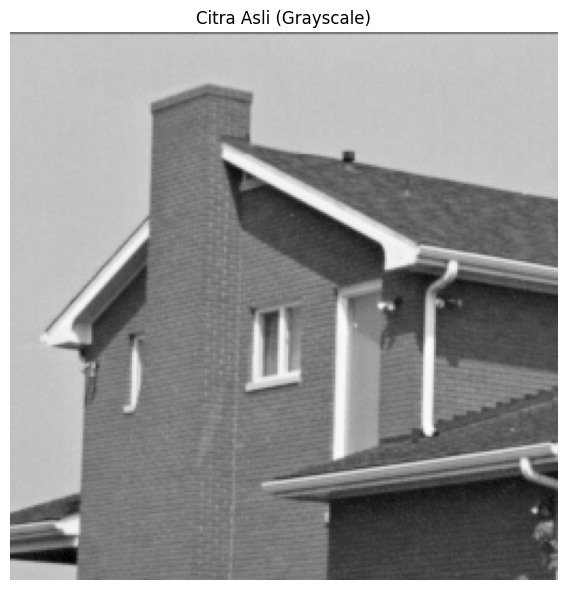

Bentuk 8 bit dari Citra:
Gambar disimpan: output_complete_analysis\2_original_8bit_planes.png


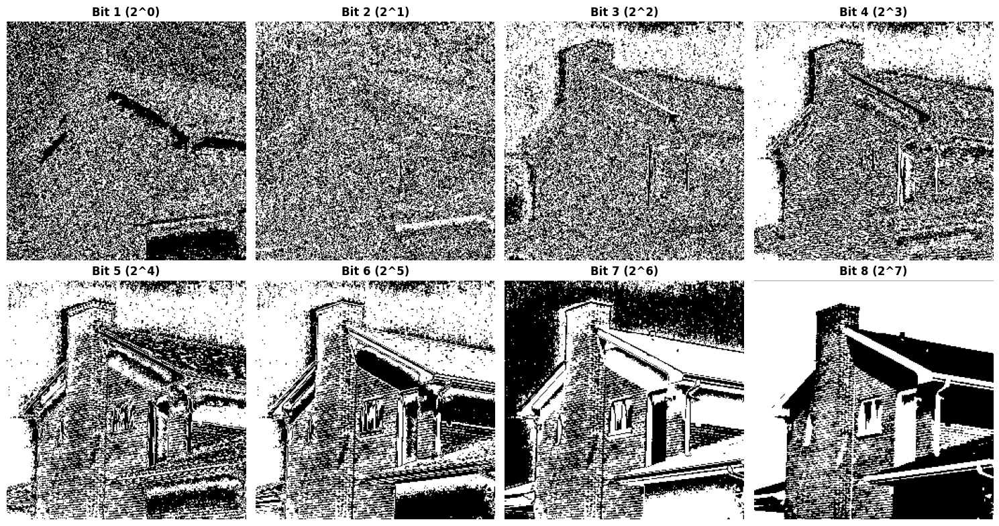

Bentuk 8-bit dari citra setelah dilakukan shuffle:
Gambar disimpan: output_complete_analysis\4_shuffle1_8bit_planes.png


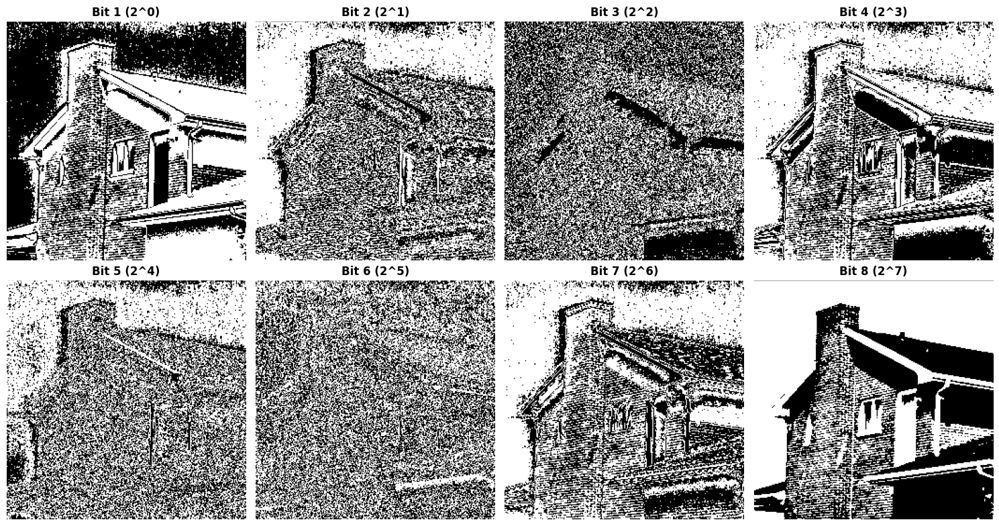

Citra plane 8-bit setelah di geser baris:
Gambar disimpan: output_complete_analysis\6_row_shift_8bit_planes.png


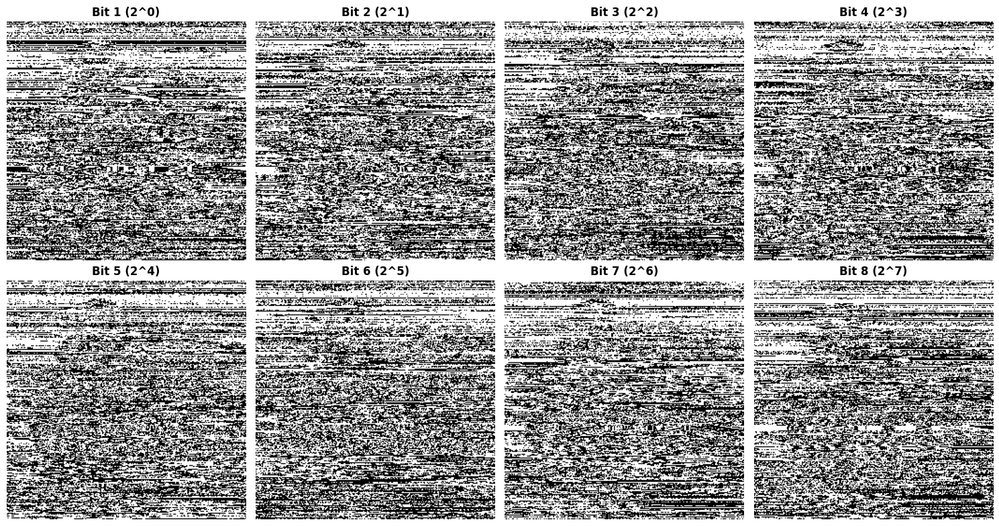

Citra plane 8-bit setelah digeser kolom:
Gambar disimpan: output_complete_analysis\8_column_shift_8bit_planes.png


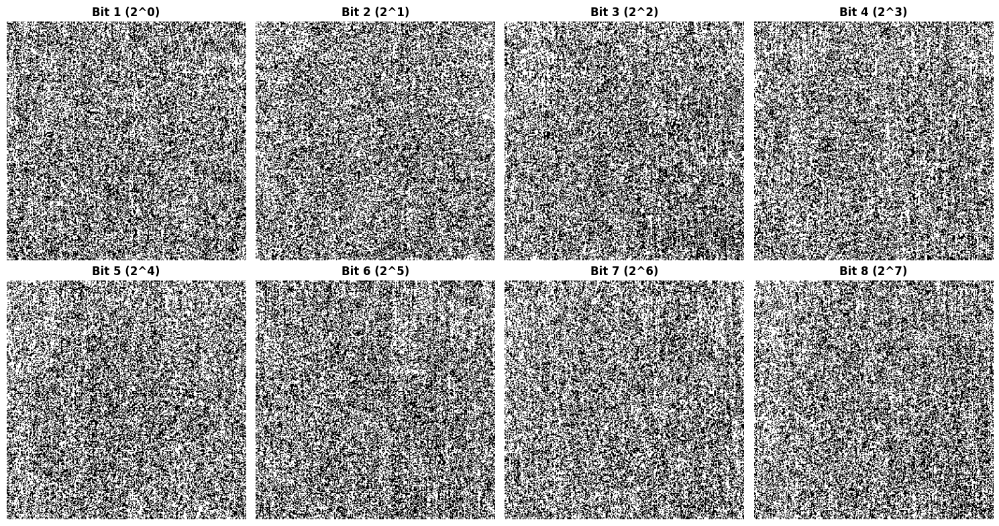

Sudah disatukan kembali:


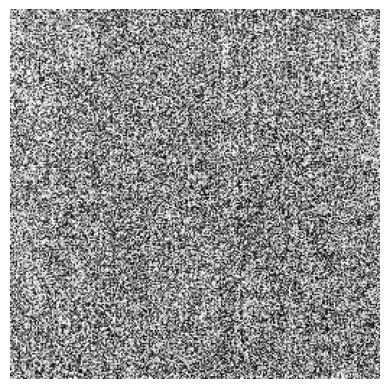

Matriks Substitusi:


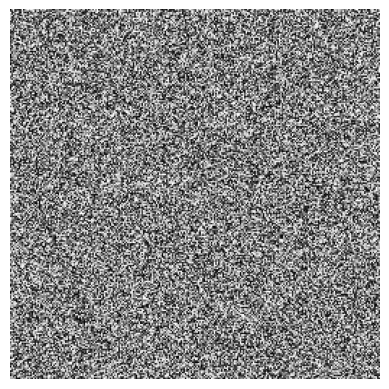

Ciphertext


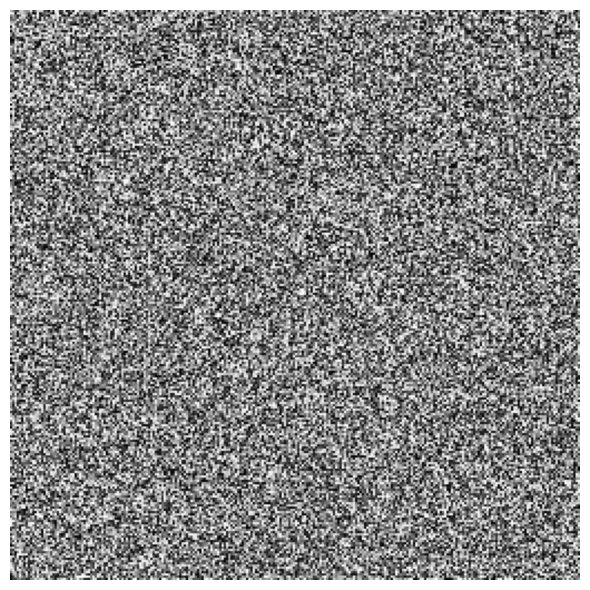

Citra Dekripsi


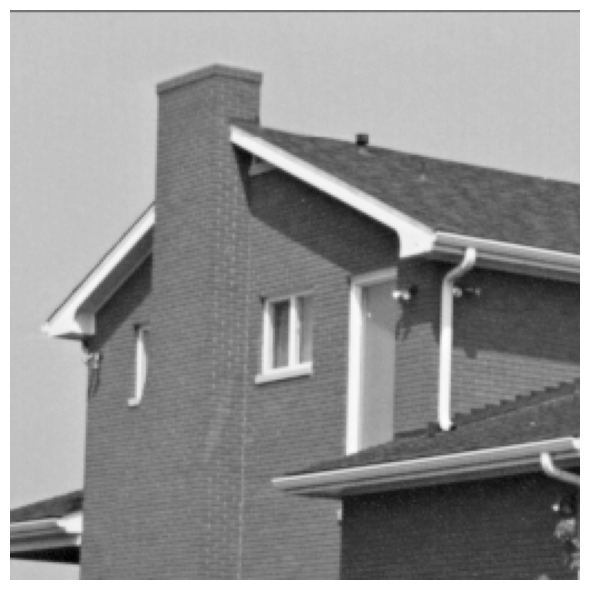

Dekripsi BERHASIL - Gambar asli dan hasil dekripsi identik


In [34]:
# ========================== CONTOH PENGGUNAAN ==========================
if __name__ == "__main__":
    # Contoh penggunaan
    image_path = "house.png"  # Ganti dengan path gambar Anda

    try:
        cipher, decrypted, steps = main_encryption_with_complete_analysis(
            image_path,
            q1=0.4,
            q2=0.6,
            output_dir="output_complete_analysis"
        )

    except Exception as e:
        print(f"\nTerjadi error: {str(e)}")
        import traceback
        traceback.print_exc()